In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
data = pd.read_csv(r"titles.csv")

In [12]:
data.head()
data.info()
data.describe()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5850 entries, 0 to 5849
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    5850 non-null   object 
 1   title                 5849 non-null   object 
 2   type                  5850 non-null   object 
 3   description           5832 non-null   object 
 4   release_year          5850 non-null   int64  
 5   age_certification     3231 non-null   object 
 6   runtime               5850 non-null   int64  
 7   genres                5850 non-null   object 
 8   production_countries  5850 non-null   object 
 9   seasons               2106 non-null   float64
 10  imdb_id               5447 non-null   object 
 11  imdb_score            5368 non-null   float64
 12  imdb_votes            5352 non-null   float64
 13  tmdb_popularity       5759 non-null   float64
 14  tmdb_score            5539 non-null   float64
dtypes: float64(5), int64(

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era p...,1945,TV-MA,51,['documentation'],['US'],1.0,NaN,NaN,NaN,0.600,NaN
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,1976,R,114,"['drama', 'crime']",['US'],NaN,tt0075314,8.2,808582.0,40.965,8.179
2,tm154986,Deliverance,MOVIE,Intent on seeing the Cahulawassee River before...,1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],NaN,tt0068473,7.7,107673.0,10.010,7.300
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],NaN,tt0071853,8.2,534486.0,15.461,7.811
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II...,1967,NaN,150,"['war', 'action']","['GB', 'US']",NaN,tt0061578,7.7,72662.0,20.398,7.600


In [11]:
#checking null values 
data.isnull().sum()

id                         0
title                      1
type                       0
description               18
release_year               0
age_certification       2619
runtime                    0
genres                     0
production_countries       0
seasons                 3744
imdb_id                  403
imdb_score               482
imdb_votes               498
tmdb_popularity           91
tmdb_score               311
dtype: int64

In [17]:
data.groupby("type").sum()

,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
type,,,,,,,
MOVIE,7547421,367712,0.0,21420.1,91841708.0,74798.158354,22940.778
SHOW,4248619,82088,4555.0,13530.2,33605867.0,55573.654000,14886.021


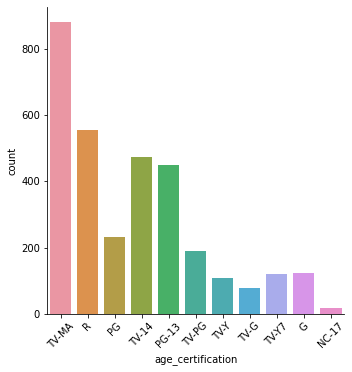

In [21]:
#analysis age certificate 
sns.catplot(x='age_certification',kind="count",data=data)
plt.xticks(rotation=45)
plt.show()

c:\users\doagu\appdata\local\programs\python\python39\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self._figure.tight_layout(*args, **kwargs)


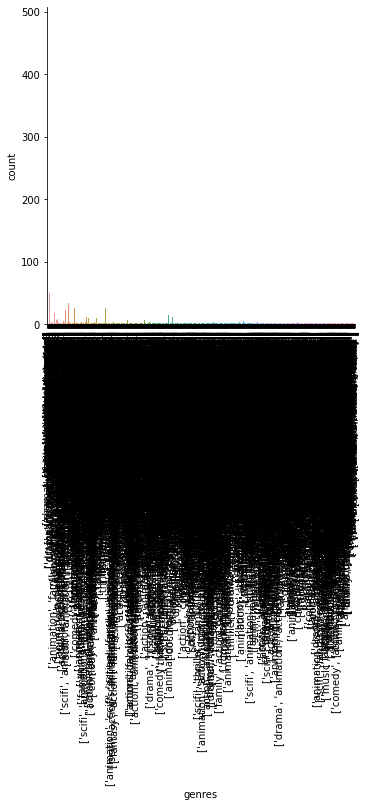

In [24]:
#Analyze Of Genres
sns.catplot(x='genres', kind="count", data=data)
plt.xticks(rotation=90)
plt.show()

In [26]:
#analysis Country
countries = data.groupby('production_countries').size().reset_index().sort_values(by = 0,ascending = 0).reset_index().drop('index',axis = 1).rename(columns = {0:'counts'})
countries

,production_countries,counts
0,['US'],1959
1,['IN'],599
2,['JP'],264
3,[],229
4,['KR'],222
...,...,...
447,"['FR', 'NL', 'SG']",1
448,"['FR', 'NL', 'GB', 'US']",1
449,"['FR', 'MX', 'ES']",1
450,"['FR', 'MX', 'CO']",1


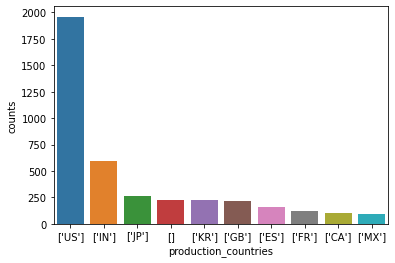

In [27]:
sns.barplot(x = countries.production_countries[:10],y = countries.counts[:10]);
plt.show()

In [28]:
labels = ['US','IN','JP','GB','KR','ES','FR','CA','MX','BR','PH','TR','NG','DE','AU']
values = [1950, 605, 266, 219,210,159,124,103,95,86,80,79,67,65,62]


In [32]:

import plotly.express as px
fig = px.pie(data, values=values, names=labels, title='Most Popular Production Countries')
fig.show()


[notice] A new release of pip available: 22.1.2 -> 22.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [34]:
release_year_count= data.release_year.value_counts()
release_year_count = pd.DataFrame(release_year_count)
release_year_count

,release_year
2019,836
2020,814
2021,787
2018,773
2017,563
...,...
1960,1
1974,1
1959,1
1978,1


In [36]:
#Analyze Of Genre of Each Age Certification
plt.figure(figsize=(24, 12), dpi=100)
sns.countplot(data=data, x="age_certification", hue="genres",palette = 'magma')

<AxesSubplot:xlabel='age_certification', ylabel='count'>

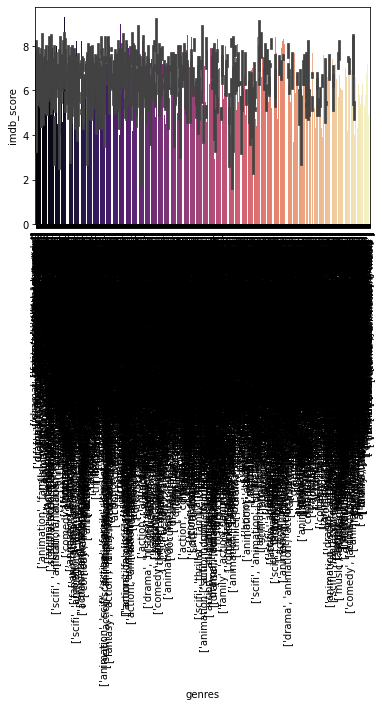

In [39]:
sns.barplot(x='genres',y='imdb_score',data=data,palette = 'magma')
plt.xticks(rotation=90)
plt.show()